# Tester of all stuff I wrote in the theory folder

In [1]:
from abc import ABC, abstractmethod
import json
from collections import defaultdict
import matplotlib.pyplot as plt
import numpy as np
import os
from scipy.stats import t as student_t
from scipy.stats import cauchy
from scipy.stats import norm
from scipy.stats import expon
from scipy.stats import bernoulli
import scipy
from typing import Type

## Metrics for finding precise solution in case means and variances are known

In [2]:
def calc_optimal_probs_on_subsimplex(means_vars, end_range, safe_lever_exists, aversion):
    # print(f"calc_optimal_probs_on_subsimplex:\nend_range: {end_range},\nsafe_lever_exists: {safe_lever_exists},\naversion: {aversion}")
    optimal_probs = np.zeros(len(means_vars))
    sigma_0 = sigma_1 = 0
    if not safe_lever_exists:
        for i in range(end_range):
            sigma_0 += 1 / (2 * aversion * means_vars[i]['var'])
            sigma_1 += means_vars[i]['mean'] / (2 * aversion * means_vars[i]['var'])
        for i in range(end_range):
            optimal_probs[means_vars[i]['idx']] = means_vars[i]['mean'] / (2 * aversion * means_vars[i]['var'])\
                                                  + (1 - sigma_1) / (sigma_0 * 2 * aversion * means_vars[i]['var'])
    else:
        probs_sum = 0
        for i in range(end_range):
            optimal_probs[means_vars[i]['idx']] = (means_vars[i]['mean'] - means_vars[end_range]['mean'])\
                / (2 * aversion * means_vars[i]['var'])
            probs_sum += optimal_probs[means_vars[i]['idx']]
        optimal_probs[means_vars[end_range]['idx']] = 1 - probs_sum
    if np.all(optimal_probs == 0):
        print("means_vars", means_vars)
        print("end_range", end_range)
        print("safe_lever_exists", safe_lever_exists)
    return optimal_probs


def get_optimal_probs(means, variances, aversion):

    means_vars = []
    for idx, (mean, var) in enumerate(zip(means, variances)):
        means_vars.append({'idx': idx, 'mean': mean, 'var': var})
    means_vars = sorted(means_vars, key=lambda x: (-x['mean'], x['var']))
    # print(f"means_vars: {means_vars}")

    highest_safe_lever_idx = len(means_vars)
    for i, mean_var in enumerate(means_vars):
        if mean_var['var'] == 0:
            highest_safe_lever_idx = i
            break
    # print(f"highest_safe_lever_idx: {highest_safe_lever_idx}")
    
    if highest_safe_lever_idx == 0:
        optimal_probs = np.zeros(len(means))
        optimal_probs[means_vars[0]['idx']] = 1
        return optimal_probs

    safe_lever_exists = (highest_safe_lever_idx != len(means_vars))
    sigma_0 = sigma_1 = 0
    for i in range(1, highest_safe_lever_idx + 1 if safe_lever_exists else len(means_vars)):
        sigma_0 += 1 / (2 * aversion * means_vars[i - 1]['var'])
        sigma_1 += means_vars[i - 1]['mean'] / (2 * aversion * means_vars[i - 1]['var'])
        probs_sum = sigma_1 - sigma_0 * means_vars[i]['mean']
        if probs_sum >= 1:
            return calc_optimal_probs_on_subsimplex(means_vars, i, False, aversion)

    return calc_optimal_probs_on_subsimplex(means_vars, highest_safe_lever_idx, safe_lever_exists, aversion)

In [3]:
def income(means, variances, probs, aversion):
    return -np.sum(means * probs - aversion * (probs ** 2) * variances)

def income_grad(means, variances, probs, aversion):
    return -(means - 2 * aversion * probs* variances)

def cauchy_simplex_approx(means, variances, aversion):
    means = np.array(means)
    variances = np.array(variances)
    epsilon_tol = 10e-3
    stop_val = 10e-9
    probs = np.ones(len(means)) / len(means)
    func_val_old = np.inf
    func_val_new = -(np.min(means) - aversion * np.max(variances))
    t = 1
    while func_val_old - func_val_new > stop_val:
        nonzero_indices = np.argwhere(probs > epsilon_tol)
        zero_indices = np.argwhere(probs <= epsilon_tol)
        probs_dot_grad = np.sum(probs * income_grad(means, variances, probs, aversion))
        max_grad = np.max(income_grad(means[nonzero_indices], variances[nonzero_indices], probs[nonzero_indices], aversion))
        tau_max = 1 / (max_grad - probs_dot_grad) if max_grad != probs_dot_grad else np.inf
        # print(f"tau_max: {tau_max}")
        tau = min(1 / t, tau_max)
        probs -= tau * probs * (income_grad(means, variances, probs, aversion) - probs_dot_grad)
        probs[zero_indices] = 0
        probs /= np.sum(probs)
        func_val_old = func_val_new
        func_val_new = income(means, variances, probs, aversion)
        t += 1
        # print(-func_val_new, -func_val_old)

    return probs


In [41]:
print(cauchy_simplex_approx([2, 3, 2, 1], [2, 2, 2, 0], 2))
print(get_optimal_probs([2, 3, 2, 1], [2, 2, 2, 0], 2))

[0.12571016 0.25040425 0.12571016 0.49817543]
[0.125 0.25  0.125 0.5  ]


In [4]:
print(cauchy_simplex_approx([4, 2, 9, 6, 2, 6], [0, 1, 5, 7, 2, 5], 1))

[0.15857725 0.         0.49952745 0.14245635 0.         0.19943896]


In [5]:
print(get_optimal_probs([4, 2, 9, 6, 2, 6], [0, 1, 5, 7, 2, 5], 1))

[0.15714286 0.         0.5        0.14285714 0.         0.2       ]


## Distribution definition

In [4]:
class Distribution(ABC):
    def __init__(self, num_distrib, loc_sampler, scale_sampler):
        self.num_distrib = num_distrib
        self.loc_sampler = loc_sampler
        self.scale_sampler = scale_sampler
        self.locations = self.loc_sampler.rvs(size=num_distrib)
        # self.zero_scales = np.ones(num_distrib)
        self.zero_scales = bernoulli(p=(num_distrib - 1) / num_distrib).rvs(size=num_distrib)
        self.scales = self.zero_scales * self.scale_sampler.rvs(size=num_distrib)
        self.distributions: list[scipy.stats.rv_continuous] = self._create_distributions()

    @abstractmethod
    def _create_distributions(self) -> list[scipy.stats.rv_continuous]:
        pass

    def pull_the_lever(self, pos) -> float:
        return self.distributions[pos].rvs()  # Draw a sample from the specified distribution
    

class Gaussian(Distribution):
    def __init__(self, num_distrib, loc_sampler=norm(loc=1, scale=1), scale_sampler=expon(loc=0, scale=2)):
        super().__init__(num_distrib, loc_sampler=loc_sampler, scale_sampler=scale_sampler)

    def _create_distributions(self) -> list[scipy.stats.rv_continuous]:
        return [
            norm(loc=loc, scale=scale) for loc, scale in zip(self.locations, self.scales)
        ]


class Student(Distribution):
    def __init__(self, num_distrib, mu, loc_sampler=norm(loc=1, scale=1), scale_sampler=expon(loc=0, scale=2), need_scale=True):
        self.need_scale = need_scale
        self.mu = mu  # degrees of freedom for Student's t distribution
        super().__init__(num_distrib, loc_sampler=loc_sampler, scale_sampler=scale_sampler)

    def _create_distributions(self) -> list[scipy.stats.rv_continuous]:
        normalize_scale = np.sqrt((self.mu - 2) / self.mu) if self.need_scale and self.mu > 2 else 1
        return [
            student_t(df=self.mu, loc=loc, scale=normalize_scale*scale) for loc, scale in zip(self.locations, self.scales)
        ]


class Cauchy(Distribution):
    def __init__(self, num_distrib, loc_sampler=norm(loc=1, scale=1), scale_sampler=expon(loc=0, scale=2)):
        super().__init__(num_distrib, loc_sampler=loc_sampler, scale_sampler=scale_sampler)

    def _create_distributions(self) -> list[scipy.stats.rv_continuous]:
        return [
            cauchy(loc=loc, scale=scale) for loc, scale in zip(self.locations, self.scales)
        ]

In [313]:
mu = 2.5
sz = 30000
print(student_t.var(df=mu, scale=np.sqrt((mu - 2) / mu) * 4))
samples = student_t(df=mu, loc=1.5, scale=np.sqrt((mu - 2) / mu) * 4).rvs(size=sz)
print((sz / (sz - 1)) * (np.sum(samples ** 2) / sz - (np.sum(samples) ** 2) / (sz ** 2)))

16.0
12.582808559970882


In [9]:
mu = 2.1
print(student_t.var(df=mu, scale=np.sqrt((mu - 2) / mu) * 4))
print(norm.var(scale=4))

16.0
16.0


In [102]:
arms = 20000

def pull_many_levers(distr):
    vals_check = np.zeros(arms)
    for i in range(arms):
        vals_check[i] = distr.pull_the_lever(i)
    return vals_check


gauss = Gaussian(num_distrib=arms)
vals_check = pull_many_levers(gauss)
print(np.mean(vals_check), np.var(vals_check))

stud2_1 = Student(num_distrib=arms, mu=2.1)
vals_check = pull_many_levers(stud2_1)
print(np.mean(vals_check), np.var(vals_check))


1.0022481987400316 9.43951556218009
0.9629504838012901 5.557578234890871


## Strategy and bandit tester definition

In [5]:
class Strategy(ABC):
    def __init__(self, num_arms, step_size):
        self.num_arms = num_arms
        self.q_values = np.zeros(num_arms) # Initialize Q-values
        self.counts = np.zeros(num_arms)  # Track visits per arm
        self.step_size = step_size

    @abstractmethod
    def choose_arm(self) -> tuple[int, np.ndarray]:
        pass

    @abstractmethod
    def update(self, arm, reward):
        pass


class AversionStrategy(Strategy):
    def __init__(self, num_arms, step_size, aversion):
        super().__init__(num_arms, step_size)
        self.q_square_values = np.zeros(num_arms)
        self.s_values = np.zeros(num_arms) # Initialize Sigma-values
        self.probs = np.ones(num_arms) / num_arms # Initialize probabilities for choosing each arm
        self.aversion = aversion

    def _update_counts_q_and_s_values(self, arm, reward):
        self.counts[arm] += 1
        self.q_values[arm] = self.q_values[arm] + self.step_size(self.counts[arm]) * (reward - self.q_values[arm])
        self.q_square_values[arm] = self.q_square_values[arm] +\
            self.step_size(self.counts[arm]) * (reward ** 2 - self.q_square_values[arm])
        self.s_values[arm] = 0 if self.counts[arm] <= 1 else (self.counts[arm] / (self.counts[arm] - 1)) *\
            (self.q_square_values[arm] - self.q_values[arm] ** 2)
        
    def get_aversion_reward_metric(self):
        return np.sum(self.probs * self.q_values - self.aversion * (self.probs ** 2) * self.s_values)


In [74]:
class BanditTester:
    def __init__(self, distribution: Type[Distribution], strategy: Type[Strategy], distribution_params, strategy_params, num_arms=10, test_num=2000, test_len=1000):
        np.random.seed(42)
        self.distribution = distribution
        self.strategy = strategy
        self.distribution_params = distribution_params
        self.distribution_params["num_distrib"] = num_arms
        self.strategy_params = strategy_params
        self.strategy_params["num_arms"] = num_arms
        self.test_num = test_num
        self.test_len = test_len

        self.average_rewards = np.zeros(self.test_len)
        self.optimal_actions = np.zeros(self.test_len)

        self.metric_results = {}
        self.metric_results['average_rewards'] = np.zeros(self.test_len)
        self.metric_results['optimal_actions'] = np.zeros(self.test_len)

    def _make_one_step(self, strategy: Strategy, distribution: Distribution) -> tuple[int, float, np.ndarray]:
        arm, probs = strategy.choose_arm()
        reward = distribution.pull_the_lever(arm)
        strategy.update(arm, reward)

        return arm, reward, probs
    
    def _get_max_reward(self, distribution: Distribution):
        return np.max(distribution.locations)
    
    def _test_one_test(self, strategy: Strategy, distribution: Distribution):
        optimal_arm = np.argmax(distribution.locations)  # Determine the optimal arm

        for i in range(self.test_len):
            arm, reward, _ = self._make_one_step(strategy, distribution)

            self.metric_results['average_rewards'][i] += reward / self.test_num
            self.metric_results['optimal_actions'][i] += int(arm == optimal_arm) / self.test_num

    def test(self) -> dict[str, np.ndarray]:
        for _ in range(self.test_num):
            strategy = self.strategy(**self.strategy_params)  # Create a new strategy instance for each run
            distribution = self.distribution(**self.distribution_params)  # Create a new distribution instance for each run

            self._test_one_test(strategy, distribution)

        return self.metric_results


class AversionBanditTester(BanditTester):
    def __init__(self,
                 distribution: Type[Distribution],
                 strategy: Type[AversionStrategy],
                 distribution_params,
                 strategy_params,
                 aversion=1,
                 num_arms=10,
                 test_num=2000,
                 test_len=1000):
        super().__init__(distribution, strategy, distribution_params, strategy_params, num_arms, test_num, test_len)
        self.aversion = aversion

        self.metric_results['average_regrets'] = np.zeros(self.test_len)
        self.metric_results['real_average_rewards'] = np.zeros(self.test_len)
        self.metric_results['real_average_regrets'] = np.zeros(self.test_len)

    def _get_opt_actions_metric(self, pred_probs, optimal_probs):
        return 1 - np.sum(np.abs(pred_probs - optimal_probs)) / 2
    
    def _get_aversion_reward_metric(self, strategy: AversionStrategy):
        return strategy.get_aversion_reward_metric()
    
    def _get_max_aversion_reward(self, distribution: Distribution, optimal_probs):
        return np.sum(optimal_probs * distribution.locations - self.aversion * (optimal_probs ** 2) * (distribution.scales ** 2))

    def _test_one_test(self, strategy: AversionStrategy, distribution: Distribution):
        optimal_probs = get_optimal_probs(distribution.locations, distribution.scales ** 2, self.aversion)
        max_reward = self._get_max_aversion_reward(distribution, optimal_probs)
        # min_prob = np.min(optimal_probs)

        for i in range(self.test_len):
            _, _, pred_probs = self._make_one_step(strategy, distribution)
            reward_as_strategy_expects = self._get_aversion_reward_metric(strategy)
            real_reward = self._get_max_aversion_reward(distribution, strategy.probs)

            self.metric_results['average_rewards'][i] += reward_as_strategy_expects / self.test_num
            self.metric_results['optimal_actions'][i] += self._get_opt_actions_metric(pred_probs, optimal_probs) / self.test_num
            self.metric_results['average_regrets'][i] += (max_reward - reward_as_strategy_expects) / self.test_num
            self.metric_results['real_average_rewards'][i] += real_reward / self.test_num
            self.metric_results['real_average_regrets'][i] += (max_reward - real_reward) / self.test_num
            
        # print(f"diff means: {strategy.q_values - distribution.locations}")
        # print(f"diff variances: {strategy.s_values / (distribution.scales * distribution.scales)}")
        # print(f"expected probs: {strategy.probs}")
        # print(f"counts to choose: {strategy.counts}")

In [7]:
avg_reward_metric = "Average aversion reward"
real_avg_reward_metric = "Real average aversion reward"
opt_action_metric = "% Optimal Action Metric"
avg_regret_metric = "Average aversion regret"
real_avg_regret_metric = "Real average aversion regret"

In [8]:
def compare_strategies(distributions: list[type[Distribution]],
                       distributions_params: list[dict],
                       distributions_names: list[str],
                       strategies: list[type[AversionStrategy]],
                       strategies_params: list[dict]):

    final_metrics = {}

    for distribution, distribution_params, distribution_name in zip(distributions, distributions_params, distributions_names):
        print(distribution_name)
        final_metrics[distribution_name] = defaultdict(list)

        for strategy, strategy_params in zip(strategies, strategies_params):
            bandit_tester = AversionBanditTester(distribution, strategy, distribution_params, strategy_params)
            metrics = bandit_tester.test()

            for key, value in metrics.items():
                final_metrics[distribution_name][key].append(value.tolist())

    return final_metrics
        

In [76]:
def compare_aversions(distributions: list[type[Distribution]],
                       distributions_params: list[dict],
                       distributions_names: list[str],
                       strategy: type[AversionStrategy],
                       strategy_params: dict,
                       aversions: list):

    final_metrics = {}

    for distribution, distribution_params, distribution_name in zip(distributions, distributions_params, distributions_names):
        print(distribution_name)
        final_metrics[distribution_name] = defaultdict(list)

        for aversion in aversions:
            bandit_tester = AversionBanditTester(distribution, strategy, distribution_params, strategy_params, aversion=aversion)
            metrics = bandit_tester.test()
    
            for key, value in metrics.items():
                final_metrics[distribution_name][key].append(value.tolist())

    return final_metrics


In [141]:
distributions = [Gaussian, Student, Student, Student]
distributions_params = [ {}, {'mu': 3}, {'mu': 2.1}, {'mu': 2}, {}]
distributions_names = ["Normal", "Student with "+r"$\nu=3$", "Student with "+r"$\nu=2.1$", "Student with "+r"$\nu=2$"]
aversions = [0.1, 0.3, 0.6, 1, 2, 4]

## Functions for plotting results

### For checking strategies

In [107]:
metrics_titles = [avg_regret_metric, real_avg_regret_metric, opt_action_metric]
metrics_names = ['average_regrets', 'real_average_regrets', 'optimal_actions']

In [224]:
def plot_strategies_results(metrics, labels, set_ylim=lambda key, i, axes_flat: None, set_legend_outside=False):

    # Define x-axis (steps)
    steps = list(range(1, 1001))

    # Create the figure and individual subplots (4 rows, 2 columns)
    fig, axes = plt.subplots(4, 3, figsize=(18, 16))

    # Flatten the 2D array of subplots to iterate over them efficiently
    axes_flat = axes.flatten()

    # Common titles for each plot
    fig.suptitle("Performance of Strategies", fontsize=18)
    for ax in axes_flat:
        ax.set_xlabel("Steps", size=12)

    # Loop through each key (distribution)
    for i, key in enumerate(metrics.keys()):
        for k, metric_name in enumerate(metrics_names):
            for label, data in zip(labels, metrics[key][metric_name]):
                axes_flat[3 * i + k].plot(steps,
                                          data if metric_name != 'optimal_actions' else [100 * x for x in data],
                                          label=label)
                
        for k, metric_title in enumerate(metrics_titles):
            axes_flat[3 * i + k].set_title(f"{key} - {metric_title}", size=12)
            axes_flat[3 * i + k].set_ylabel(metric_title, size=12)
            if set_legend_outside is False:
                axes_flat[3 * i + k].legend()

        set_ylim(key, i, axes_flat)

    if set_legend_outside is True:
        handles, labels = ax.get_legend_handles_labels()
        fig.legend(handles, labels, bbox_to_anchor=(0.5,-0.1), loc='lower center', ncol=len(labels) // 1, prop={'size': 20})
        

    # Adjust layout and display the plots
    plt.tight_layout()
    plt.show()


In [109]:
def plot_distributions_results(metrics, labels, set_ylim=lambda label, i, axes_flat: None):

    # Define x-axis (steps)
    steps = list(range(1, 1001))

    # Create the figure and individual subplots (4 rows, 3 columns)
    fig, axes = plt.subplots(len(labels), 3, figsize=(18, 4 * len(labels)))

    # Flatten the 2D array of subplots to iterate over them efficiently
    axes_flat = axes.flatten()

    # Common titles for each plot
    fig.suptitle("Performance of Strategies", fontsize=16)
    for ax in axes_flat:
        ax.set_xlabel("Steps")

    for i, label in enumerate(labels):
        for key in metrics.keys():
            for k, metric_name in enumerate(metrics_names):
                axes_flat[3 * i + k].plot(steps,
                                          metrics[key][metric_name][i] if metric_name != 'optimal_actions'
                                          else [100 * x for x in metrics[key][metric_name][i]],
                                          label=key)

        for k, metric_title in enumerate(metrics_titles):
            axes_flat[3 * i + k].set_title(f"{label} - {metric_title}")
            axes_flat[3 * i + k].set_ylabel(metric_title)
            axes_flat[3 * i + k].legend()
            
        set_ylim(label, i, axes_flat)
        

    # Adjust layout and display the plots
    plt.tight_layout()
    plt.show()

### For checking aversions

In [110]:
def plot_aversion_depend_on_distribution_results(metrics, aversions, strategy_name, set_ylim=lambda label, i, axes_flat: None):
    
    # Define x-axis (steps)
    steps = list(range(1, 1001))

    # Create the figure and individual subplots (4 rows, 2 columns)
    fig, axes = plt.subplots(4, 3, figsize=(17, 15))

    # Flatten the 2D array of subplots to iterate over them efficiently
    axes_flat = axes.flatten()

    # Common titles for each plot
    fig.suptitle(f"Performance via aversion for {strategy_name}", fontsize=16)
    for ax in axes_flat:
        ax.set_xlabel("Steps")

    # Loop through each key (distribution)
    for i, key in enumerate(metrics.keys()):
        for k, metric_name in enumerate(metrics_names):
            for aversion_label, data in zip(aversions, metrics[key][metric_name]):
                axes_flat[3 * i + k].plot(steps,
                                          data if metric_name != 'optimal_actions' else [100 * x for x in data],
                                          label=f"aversion: {str(aversion_label)}")

        for k, metric_title in enumerate(metrics_titles):
            axes_flat[3 * i + k].set_title(f"{metric_title}, {key}")
            axes_flat[3 * i + k].set_ylabel(metric_title)

        set_ylim(key, i, axes_flat)
        
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, bbox_to_anchor=(0.5,-0.08), loc='lower center', ncol=len(labels) // 2, prop={'size': 20})
    # Adjust layout and display the plots
    plt.tight_layout()
    plt.show()

In [111]:
def plot_results_via_aversions(metrics, aversions, strategy_name, set_ylim=lambda label, i, axes_flat: None):
    # Define x-axis (steps)
    steps = list(range(1, 1001))

    # Create the figure and individual subplots (4 rows, 2 columns)
    fig, axes = plt.subplots(len(aversions), 3, figsize=(18, 4 * len(aversions)))

    # Flatten the 2D array of subplots to iterate over them efficiently
    axes_flat = axes.flatten()

    # Common titles for each plot
    fig.suptitle(f"Performance via aversions for {strategy_name}", fontsize=16)
    for ax in axes_flat:
        ax.set_xlabel("Steps")

    for i, aversion_label in enumerate(aversions):
        for key in metrics.keys():
            if key != "Student with "+r"$\nu=2$":
                for k, metric_name in enumerate(metrics_names):
                    axes_flat[3 * i + k].plot(steps,
                                            metrics[key][metric_name][i] if metric_name != 'optimal_actions'
                                            else [100 * x for x in metrics[key][metric_name][i]],
                                            label=key)
                
        for k, metric_title in enumerate(metrics_titles):
            axes_flat[3 * i + k].set_title(f"aversion={str(aversion_label)} - {metric_title}")
            axes_flat[3 * i + k].set_ylabel(metric_title)
            axes_flat[3 * i + k].legend()

        set_ylim(aversion_label, i, axes_flat)
        

    # Adjust layout and display the plots
    plt.tight_layout()
    plt.show()

In [129]:
def plot_last_results_depending_on_aversion(metrics, aversions, strategy_name):
    fig, axes = plt.subplots(4, 3, figsize=(18, 16))

    axes_flat = axes.flatten()

    fig.suptitle(f"Performance via aversions on the last 5 steps for {strategy_name}, log scale", fontsize=16)
    for ax in axes_flat:
        ax.set_xlabel("Aversion", size=12)

    for i, key in enumerate(metrics.keys()):
        for k, metric_name in enumerate(metrics_names):
            values = []
            for data in metrics[key][metric_name]:
                values.append(np.mean(np.array(data[-5:])))
            axes_flat[3 * i + k].plot(aversions,
                                      values if metric_name != 'optimal_actions' else [100 * x for x in values])

        for k, metric_title in enumerate(metrics_titles):
            axes_flat[3 * i + k].set_title(f"{metric_title}, {key}", size=12)
            axes_flat[3 * i + k].set_ylabel(metric_title, size=12)
            axes_flat[3 * i + k].set_xscale('log')
            axes_flat[3 * i + k].set_xticks(aversions, [str(aversion) for aversion in aversions])
    
    # Adjust layout and display the plots
    plt.tight_layout()
    plt.show()

### Save the metrics

In [14]:
all_metrics_path = "all_metrics.json"

def save_new_metrics(metrics, test_key):
    if os.path.exists(all_metrics_path):
        # read existing file and append new data
        with open(all_metrics_path,"r") as f:
            all_metrics = json.load(f)
    else:
        # create new json
        all_metrics = {}

    all_metrics[test_key] = metrics
    with open(all_metrics_path, "w") as write_file:
        json.dump(all_metrics, write_file)

## Greedy and $\epsilon$-greedy

In [18]:
class EpsilonGreedy(AversionStrategy):
    def __init__(self, num_arms, epsilon=0.1, step_size=lambda count: 1 / count, aversion=1.):
        super().__init__(num_arms, step_size=step_size, aversion=aversion)
        self.epsilon = epsilon

    def choose_arm(self) -> tuple[int, np.ndarray]:
        if np.random.random() < self.epsilon:
            # Explore: choose random arm
            return np.random.randint(0, self.num_arms), np.ones(self.num_arms) / self.num_arms
        else:
            if np.any(self.probs < 0):
               print(self.probs)
               print(f"q: {self.q_values}")
               print(f"q_square: {self.q_square_values}")
               print(f"s:{self.s_values}")
            arm = np.random.choice(np.arange(self.num_arms), p=self.probs)
            return arm, self.probs

    def update(self, arm, reward):
        self._update_counts_q_and_s_values(arm, reward)

        self.probs = get_optimal_probs(self.q_values, self.s_values, self.aversion)
        self.probs /= np.sum(self.probs) # Normalization for numpy.random.choice correct work


class Greedy(EpsilonGreedy):
    def __init__(self, num_arms, step_size=lambda count: 1 / count):
        super().__init__(num_arms, epsilon=0, step_size=step_size)

In [72]:
strategies = [Greedy, EpsilonGreedy, EpsilonGreedy]
strategies_params = [{}, {'epsilon': 0.01}, {'epsilon': 0.1}]

In [77]:
aversion_metrics = compare_aversions(distributions, distributions_params, distributions_names, EpsilonGreedy, {'epsilon': 0.1}, aversions)

Normal
Student with $\nu=3$
Student with $\nu=2.1$
Student with $\nu=2$


In [78]:
save_new_metrics(aversion_metrics, 'eps_greedy_aversions_test')

In [92]:
def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(None, 0.8)
        axes_flat[3 * i + 1].set_ylim(-0.1, 0.6)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(None, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.1, 0.75)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(None, 0.4)
        axes_flat[3 * i + 1].set_ylim(-0.1, 2)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 3:
        axes_flat[3 * i].set_ylim(-0.1, None)
        axes_flat[3 * i + 1].set_ylim(-0.1, 0.75)

In [80]:
with open(all_metrics_path,"r") as f:
    all_metrics = json.load(f)

In [53]:
print(all_metrics['eps_greedy_aversions_test']['Normal'].keys())

dict_keys(['average_rewards', 'optimal_actions', 'average_regrets', 'real_average_rewards', 'real_average_regrets'])


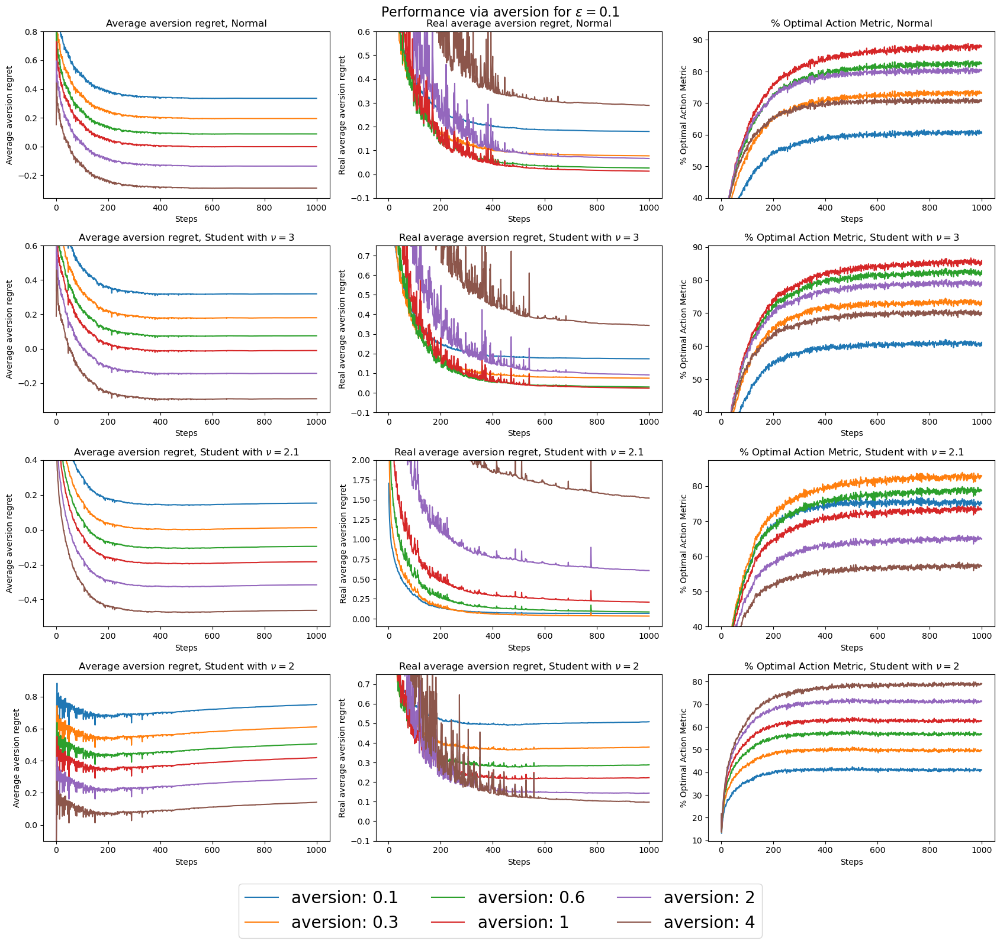

In [93]:
plot_aversion_depend_on_distribution_results(all_metrics['eps_greedy_aversions_test'], aversions, r"$\epsilon = 0.1$", set_ylim=set_ylim)

In [100]:
def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(None, 0.6)
        axes_flat[3 * i + 1].set_ylim(0, 0.4)
    elif i == 1:
        axes_flat[3 * i].set_ylim(None, 0.4)
        axes_flat[3 * i + 1].set_ylim(0, 0.2)
        axes_flat[3 * i + 2].set_ylim(50, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(None, 0.3)
        axes_flat[3 * i + 1].set_ylim(0, 0.25)
        axes_flat[3 * i + 2].set_ylim(60, None)
    elif i == 3:
        axes_flat[3 * i].set_ylim(None, 0.1)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.5)
        axes_flat[3 * i + 2].set_ylim(50, None)
    elif i == 4:
        axes_flat[3 * i].set_ylim(None, 0.05)
        axes_flat[3 * i + 1].set_ylim(-0.1, 2)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 5:
        axes_flat[3 * i].set_ylim(None, 0)
        axes_flat[3 * i + 1].set_ylim(-0.1, 5)
        axes_flat[3 * i + 2].set_ylim(35, None)

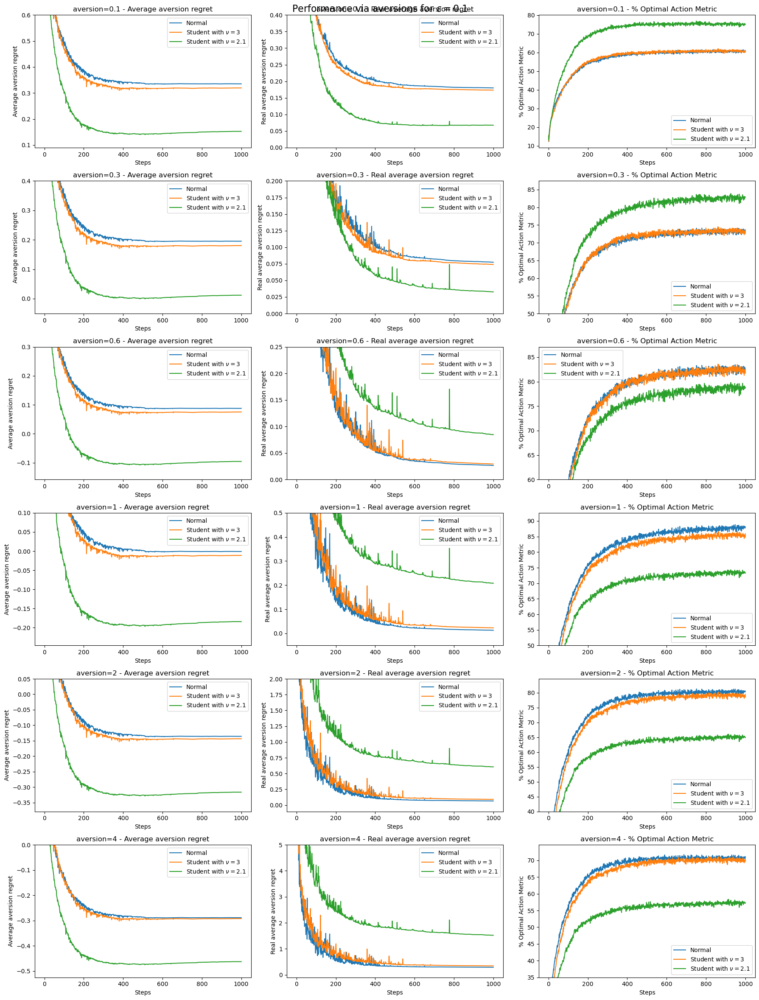

In [101]:
plot_results_via_aversions(all_metrics['eps_greedy_aversions_test'], aversions, r"$\epsilon = 0.1$", set_ylim)

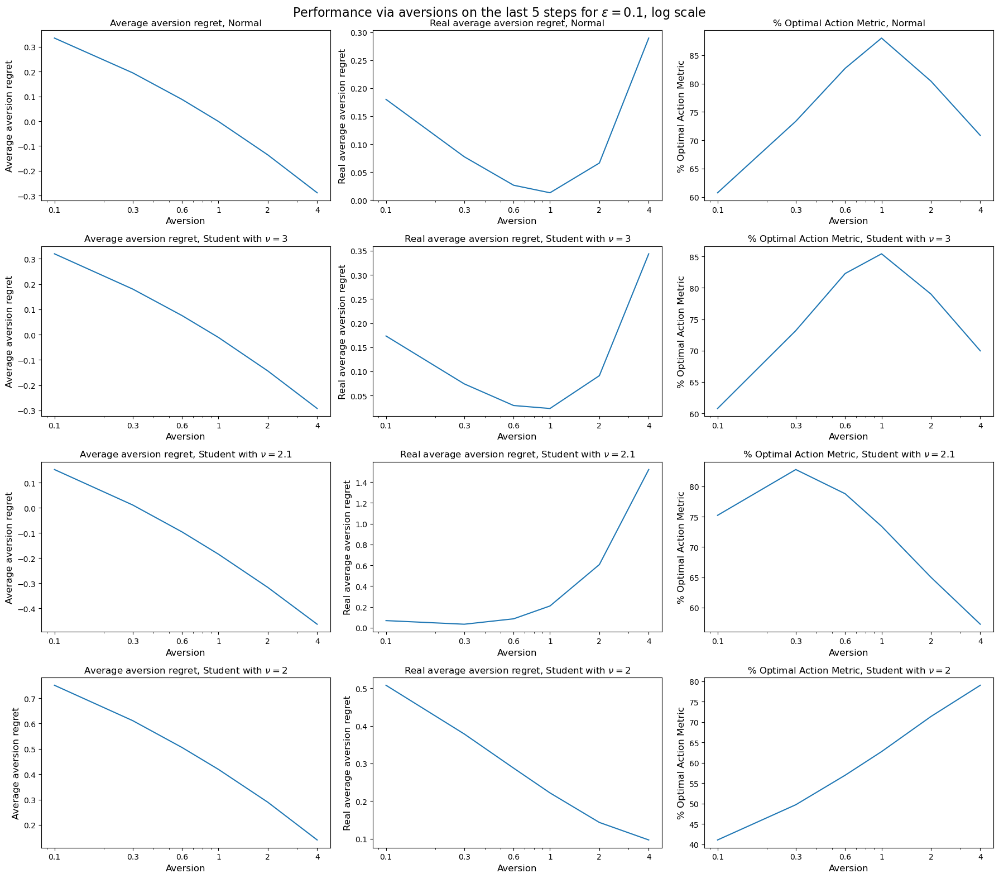

In [130]:
plot_last_results_depending_on_aversion(all_metrics['eps_greedy_aversions_test'], aversions, r"$\epsilon = 0.1$")

In [332]:
metrics = compare_strategies(distributions, distributions_params, distributions_names, strategies, strategies_params)

Normal
Student with $\nu=3$
Student with $\nu=2.1$
Student with $\nu=2$


In [333]:
save_new_metrics(metrics, 'eps_greedy_test')

In [371]:
labels = [r"$\epsilon = 0$ (greedy)", r"$\epsilon = 0.01$", r"$\epsilon = 0.1$"]

def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 3:
        axes_flat[3 * i].set_ylim(0.2, None)
    axes_flat[3 * i + 1].set_ylim(-0.05, 1.75)  # Set y-axis limits for optimal action to [15, 90]

def set_label_ylim(label: str, i: int, axes_flat) -> None:
    axes_flat[3 * i + 2].set_ylim(18, None)
    axes_flat[3 * i + 1].set_ylim(-0.05, 2)
    if i == 0:
        axes_flat[3 * i].set_ylim(0.55, 0.8)
        axes_flat[3 * i + 1].set_ylim(0.25, 2)
    elif i == 1:
        axes_flat[3 * i].set_ylim(None, 0.8)
    else:
        axes_flat[3 * i].set_ylim(None, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 1.)

In [25]:
with open(all_metrics_path,"r") as f:
    all_metrics = json.load(f)

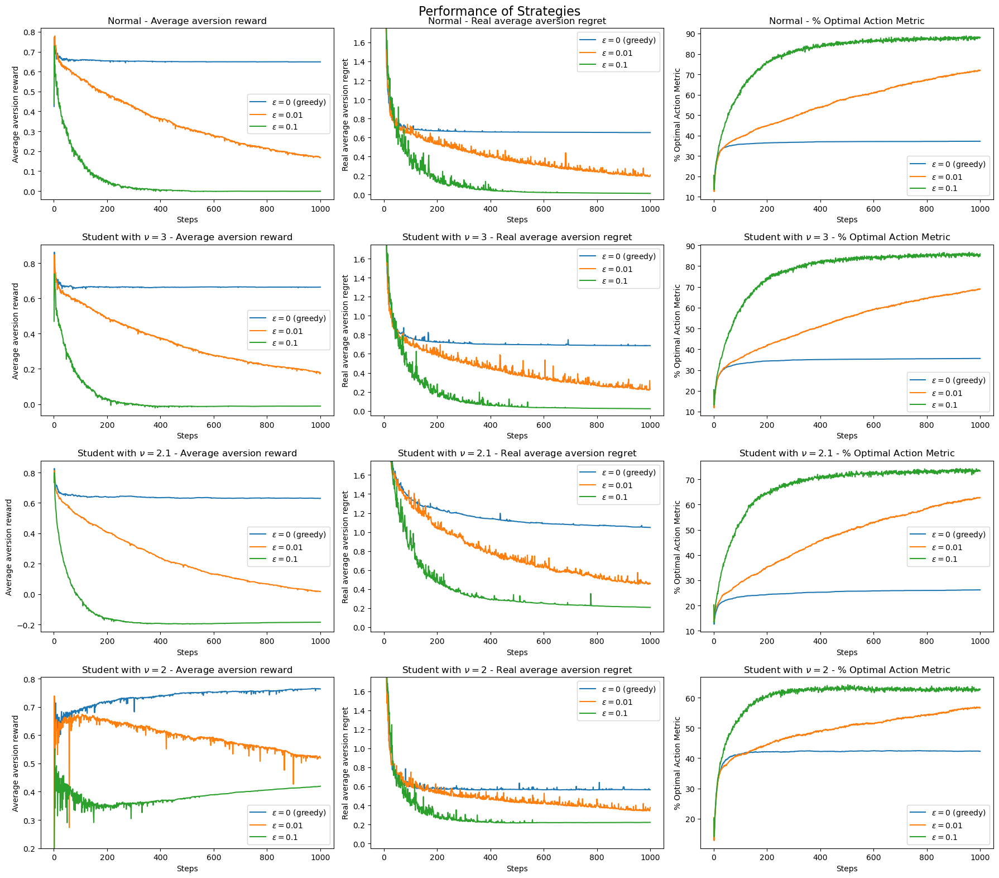

In [374]:
plot_strategies_results(metrics,
                        labels,
                        set_ylim)

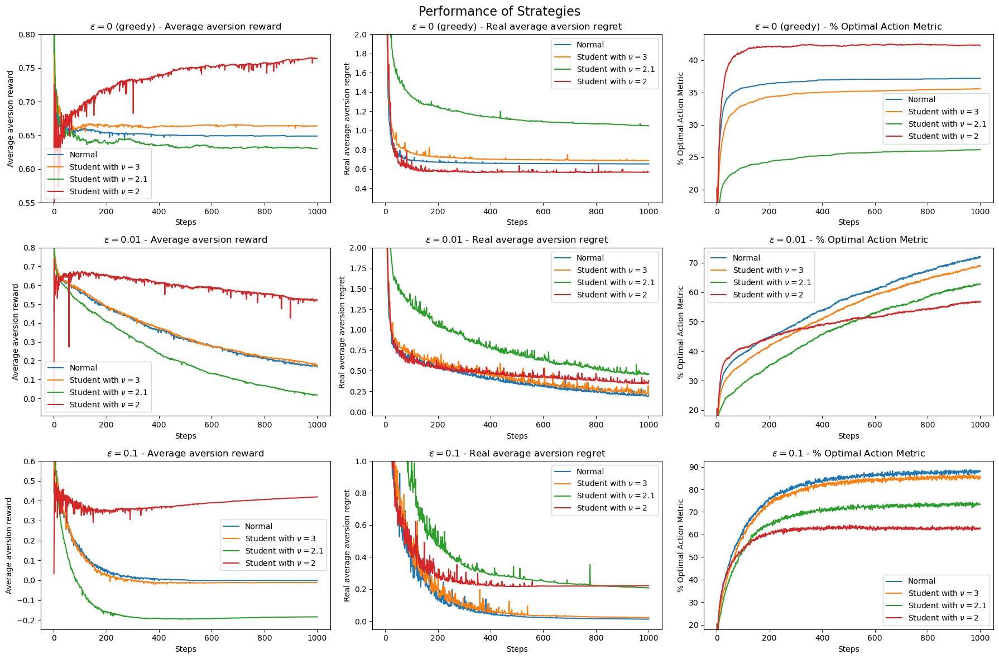

In [372]:
plot_distributions_results(metrics,
                           labels,
                           set_ylim=set_label_ylim)

## Adaptive $\epsilon$-greedy strategies

In [133]:
class DecreasingEpsilonGreedy(EpsilonGreedy):
    def __init__(self, num_arms, epsilon=1, step_size=lambda count: 1 / count, aversion=1.):
        super().__init__(num_arms, epsilon=epsilon, step_size=step_size, aversion=aversion)
        self.t = 0

    def choose_arm(self) -> tuple[int, np.ndarray]:
        self.t += 1
        if np.random.random() < self.epsilon / self.t:
            # Explore: choose random arm
            return np.random.randint(0, self.num_arms), np.ones(self.num_arms) / self.num_arms
        else:
            return np.random.choice(np.arange(self.num_arms), p=self.probs), self.probs
        

class VDBEEpsilonGreedy(EpsilonGreedy):
    def __init__(self, num_arms, epsilon=1, step_size=lambda count: 1 / count, aversion=1., temperature=1., eps_step_size=0.1):
        super().__init__(num_arms, epsilon=epsilon, step_size=step_size, aversion=aversion)
        self.temp = temperature
        self.eps_step_size = eps_step_size
    
    def update(self, arm, reward):
        old_w = self.q_values[arm] - 2 * self.aversion * self.probs[arm] * self.s_values[arm]
        super().update(arm, reward)
        new_w = self.q_values[arm] - 2 * self.aversion * self.probs[arm] * self.s_values[arm]
        old_w -= np.maximum(old_w, new_w)
        new_w -= np.maximum(old_w, new_w)
        exp_old_w = np.exp(old_w / self.temp)
        exp_new_w = np.exp(new_w / self.temp)
        try:
            current_eps = np.abs((exp_old_w - exp_new_w) / (exp_old_w + exp_new_w))
        except RuntimeWarning:
            print(old_w, new_w, exp_old_w, exp_new_w)
        self.epsilon = self.eps_step_size * current_eps + (1 - self.eps_step_size) * self.epsilon
    

In [142]:
strategies = [EpsilonGreedy, DecreasingEpsilonGreedy, DecreasingEpsilonGreedy, VDBEEpsilonGreedy, VDBEEpsilonGreedy]
strategies_params = [{'epsilon': 0.1},
                     {'epsilon': 1},
                     {'epsilon': 10},
                     {'epsilon': 1, 'temperature': 1., 'eps_step_size': 0.1},
                     {'epsilon': 10, 'temperature': 1., 'eps_step_size': 0.1}]

In [144]:
metrics = compare_strategies(distributions, distributions_params, distributions_names, strategies, strategies_params)

Normal
Student with $\nu=3$
Student with $\nu=2.1$
Student with $\nu=2$


In [145]:
save_new_metrics(metrics, 'adaptive_eps_test')

In [170]:
def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0 or i == 1:
        axes_flat[3 * i].set_ylim(-0.1, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.8)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.4, 0.5)
        axes_flat[3 * i + 1].set_ylim(0.15, 1.2)
        axes_flat[3 * i + 2].set_ylim(30, None)
    elif i == 3:
        axes_flat[3 * i].set_ylim(0.2, 0.7)
        axes_flat[3 * i + 1].set_ylim(0.15, 0.8)
        axes_flat[3 * i + 2].set_ylim(40, None)

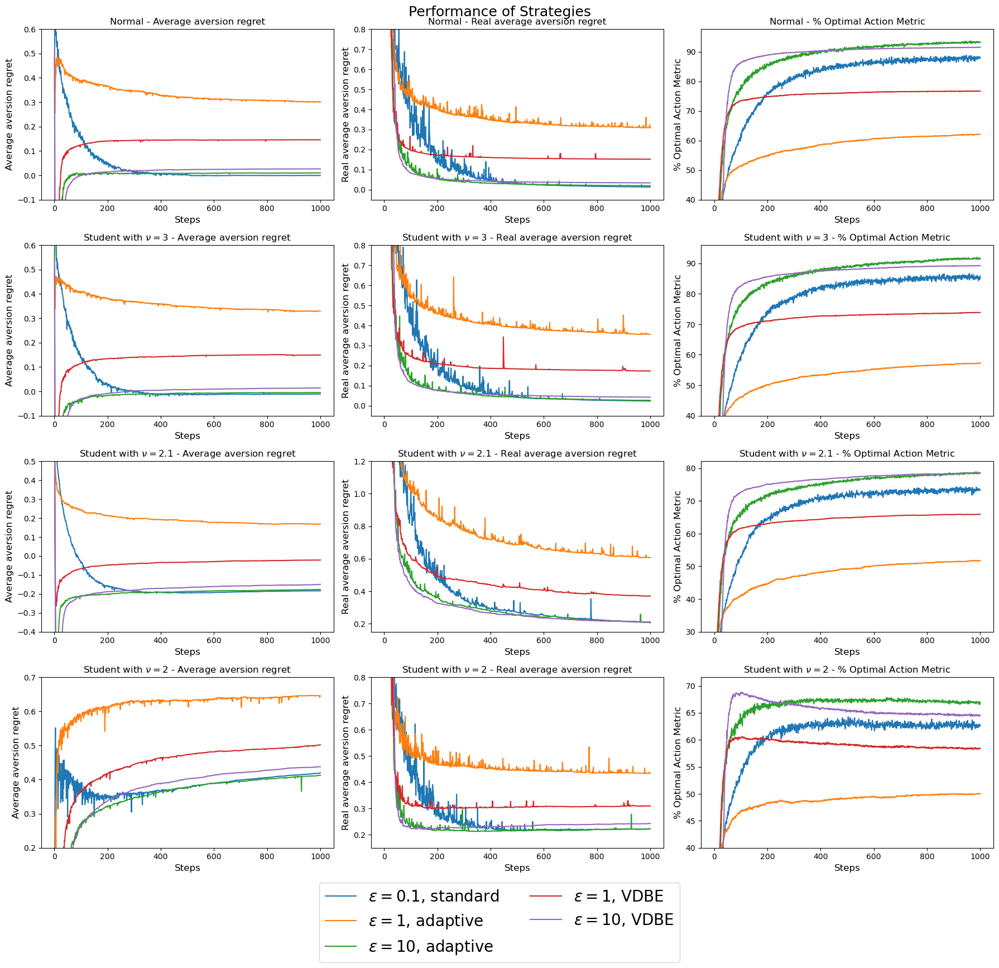

In [176]:
labels = [r"$\epsilon = 0.1$, standard",
          r"$\epsilon = 1$, adaptive",
          r"$\epsilon = 10$, adaptive",
          r"$\epsilon = 1$, VDBE",
          r"$\epsilon = 10$, VDBE"]

plot_strategies_results(metrics, labels, set_ylim, set_legend_outside=True)

In [183]:
def set_label_ylim(label: str, i: int, axes_flat) -> None:
    axes_flat[3 * i + 2].set_ylim(40, None)
    if i == 0:
        axes_flat[3 * i].set_ylim(None, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.7)
    elif i == 1:
        axes_flat[3 * i].set_ylim(0.1, 0.7)
        axes_flat[3 * i + 1].set_ylim(0.25, 1.25)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.6, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.6)
    elif i == 3:
        axes_flat[3 * i].set_ylim(-0.5, 0.6)
        axes_flat[3 * i + 1].set_ylim(0.1, 0.7)
    elif i == 4:
        axes_flat[3 * i].set_ylim(-1, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.5)

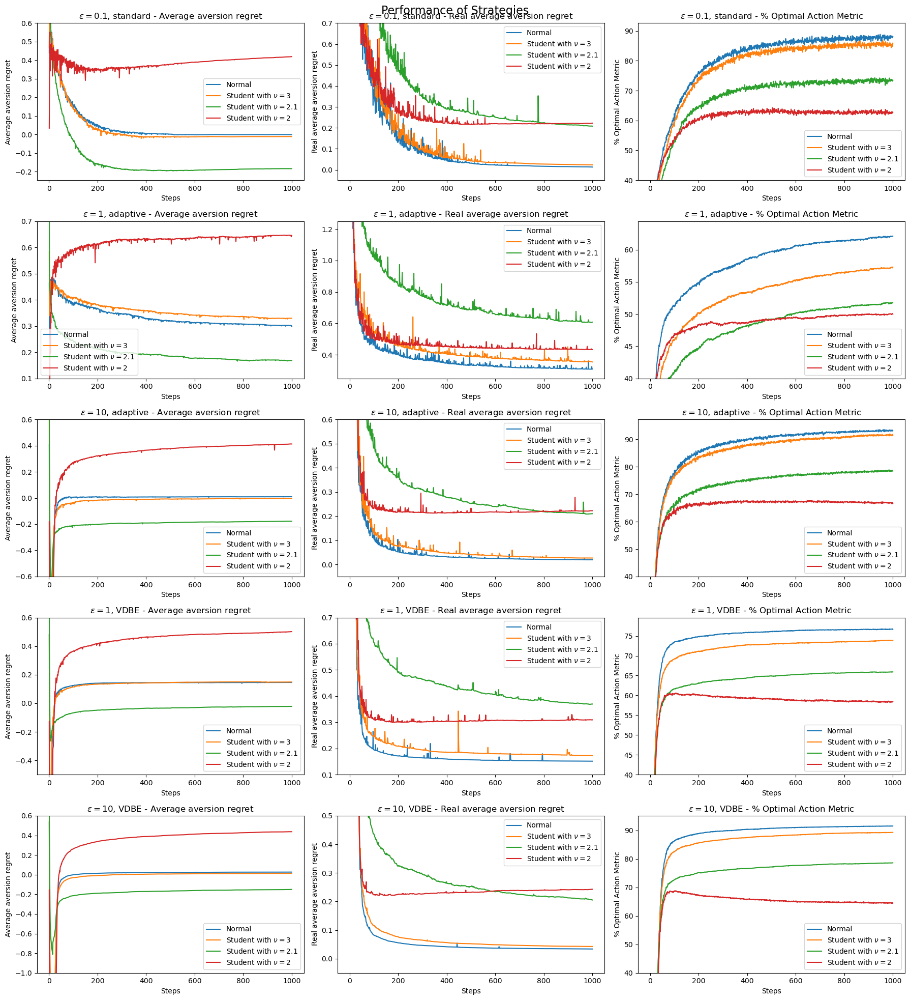

In [184]:
plot_distributions_results(metrics, labels, set_label_ylim)

In [149]:
aversion_metrics = compare_aversions(distributions, distributions_params, distributions_names, DecreasingEpsilonGreedy, {'epsilon': 10}, aversions)

Normal


Student with $\nu=3$
Student with $\nu=2.1$
Student with $\nu=2$


In [150]:
save_new_metrics(aversion_metrics, 'adaptive_eps_aversions_test')

In [200]:
def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.6, 0.6)
        axes_flat[3 * i + 1].set_ylim(0, 0.4)
        axes_flat[3 * i + 2].set_ylim(45, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(-0.5, 0.45)
        axes_flat[3 * i + 1].set_ylim(0, 0.3)
        axes_flat[3 * i + 2].set_ylim(50, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.7, 0.3)
        axes_flat[3 * i + 1].set_ylim(0, 2.5)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 3:
        axes_flat[3 * i].set_ylim(-0.2, 1)
        axes_flat[3 * i + 1].set_ylim(0.05, 0.6)
        axes_flat[3 * i + 2].set_ylim(30, None)

In [152]:
with open(all_metrics_path,"r") as f:
    all_metrics = json.load(f)

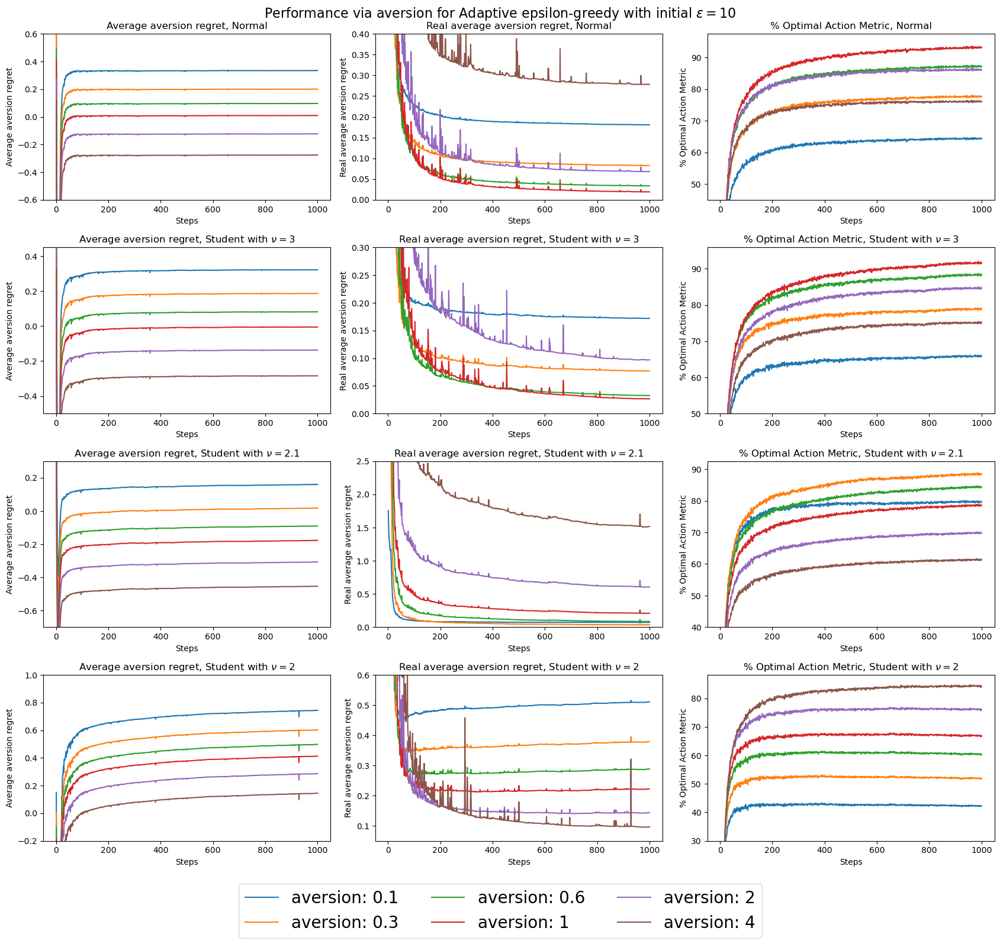

In [201]:
plot_aversion_depend_on_distribution_results(all_metrics['adaptive_eps_aversions_test'], aversions, r"Adaptive epsilon-greedy with initial $\epsilon = 10$", set_ylim=set_ylim)

In [204]:
def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.25, 0.6)
        axes_flat[3 * i + 1].set_ylim(0, 0.35)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(-0.5, 0.4)
        axes_flat[3 * i + 1].set_ylim(0, 0.2)
        axes_flat[3 * i + 2].set_ylim(60, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.5, 0.3)
        axes_flat[3 * i + 1].set_ylim(0, 0.25)
        axes_flat[3 * i + 2].set_ylim(60, None)
    elif i == 3:
        axes_flat[3 * i].set_ylim(-0.5, 0.25)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.5)
        axes_flat[3 * i + 2].set_ylim(50, None)
    elif i == 4:
        axes_flat[3 * i].set_ylim(-0.6, 0.05)
        axes_flat[3 * i + 1].set_ylim(-0.1, 1.75)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 5:
        axes_flat[3 * i].set_ylim(-1, 0)
        axes_flat[3 * i + 1].set_ylim(-0.1, 3.5)
        axes_flat[3 * i + 2].set_ylim(35, None)

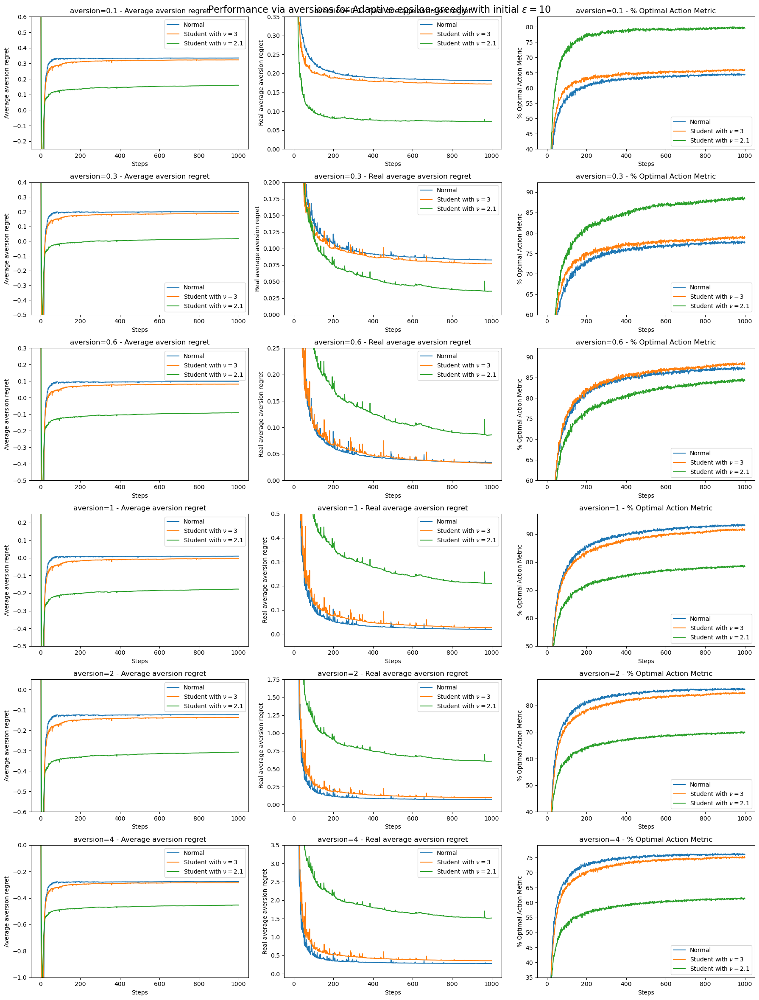

In [205]:
plot_results_via_aversions(all_metrics['adaptive_eps_aversions_test'], aversions, r"Adaptive epsilon-greedy with initial $\epsilon = 10$", set_ylim)

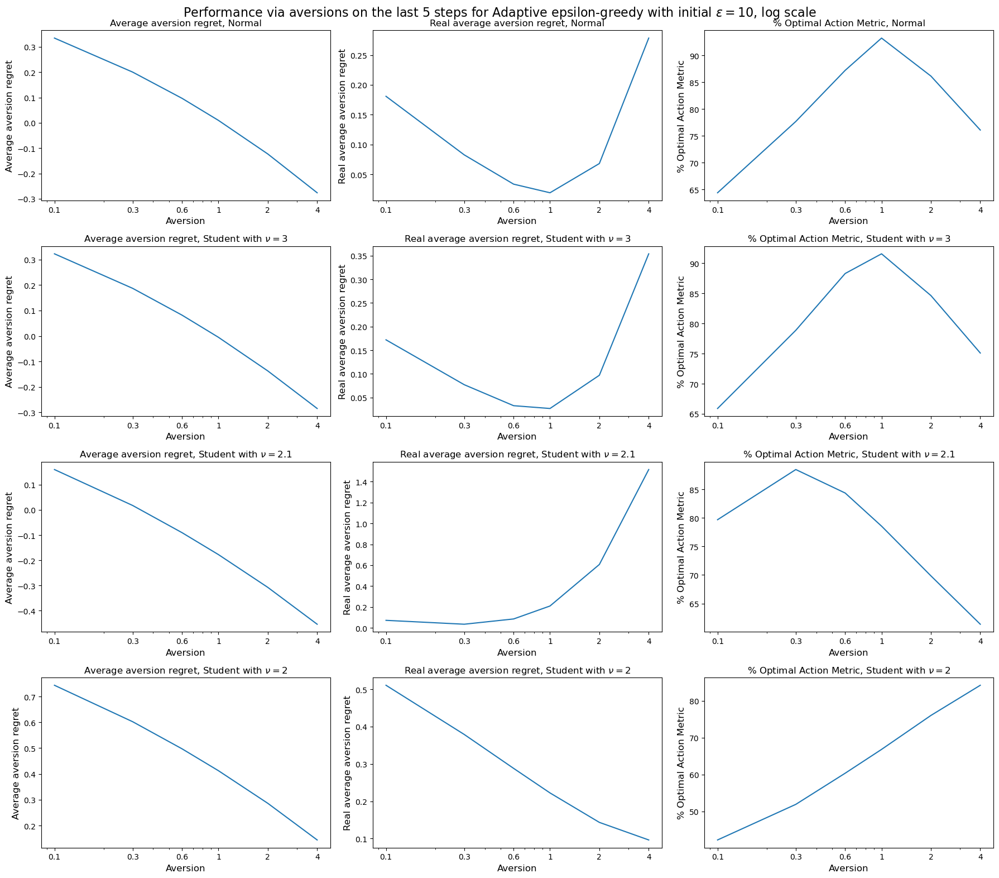

In [206]:
plot_last_results_depending_on_aversion(all_metrics['adaptive_eps_aversions_test'], aversions, r"Adaptive epsilon-greedy with initial $\epsilon = 10$")

## Positive initialization

In [207]:
class PositiveQ(EpsilonGreedy):
    def __init__(self, num_arms, epsilon=0, step_size=0.1, pos_q=6, aversion=1.):
        super().__init__(num_arms, epsilon=epsilon, step_size=step_size, aversion=aversion)
        self.q_values = np.ones(num_arms) * pos_q  # Initialize Q-values with positive values
        self.last_rewards = np.ones(num_arms) * -100_000_000
        self.s_values_middle = np.zeros(num_arms)
        self.weights_koef = np.ones(num_arms)

    def update(self, arm, reward):
        self.s_values_middle[arm] = (1 - self.step_size) * (
            self.s_values_middle[arm] + self.step_size * ((reward - self.q_values[arm]) ** 2))

        self.weights_koef[arm] *= (1 - self.step_size) ** 2
        scale = (2 - self.step_size) / (2 * (1 - self.step_size) * (1 - self.weights_koef[arm]))
        self.s_values[arm] = scale * self.s_values_middle[arm]

        self.q_values[arm] = self.q_values[arm] + (1 - self.step_size) * (reward - self.q_values[arm])
        self.counts[arm] += 1

        if self.last_rewards[arm] == reward: # asset is riskless
            self.s_values[arm] = 0
        self.last_rewards[arm] = reward
        self.probs = get_optimal_probs(self.q_values, self.s_values, self.aversion)
        # print("probs", self.probs)
        if np.all(self.probs == 0):
            print("probs", self.probs)
            print("q", self.q_values)
            print("s", self.s_values)
        self.probs /= np.sum(self.probs) # Normalization for numpy.random.choice correct work

In [208]:
strategies = [PositiveQ, PositiveQ, EpsilonGreedy]
strategies_params = [{'epsilon': 0}, {'epsilon': 0.1}, {'epsilon': 0.1}]

In [210]:
metrics = compare_strategies(distributions, distributions_params, distributions_names, strategies, strategies_params)

Normal
Student with $\nu=3$
Student with $\nu=2.1$
Student with $\nu=2$


In [211]:
labels = ["Optimistic, greedy"+"\n"+r"$Q_1=8, \epsilon = 0$",
          r"Optimistic, $\epsilon$-greedy"+"\n"+r"$Q_1=8, \epsilon = 0.1$",
          r"Realistic, $\epsilon$-greedy"+"\n"+r"$Q_1=0, \epsilon = 0.1$"]

def set_ylim(key: str, i: int, axes_flat) -> None:
    axes_flat[2 * i].set_ylim(1, 2.5)  # Set lowest y-axis value to 0.2

    # Special adjustments for the last row (Standard Cauchy)
    if key == "Cauchy":
        axes_flat[2 * i].set_ylim(-15, 10)  # Set x-axis limits for average reward
        axes_flat[2 * i + 1].set_ylim(None, 50)  # Set x-axis limits for optimal action

def set_label_ylim(label: str, i: int, axes_flat) -> None:
    axes_flat[2 * i].set_ylim(0.7, 2.5)

In [212]:
save_new_metrics(metrics, 'positive_init_test')

In [220]:
def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.2, 0.6)
        axes_flat[3 * i + 1].set_ylim(0, 0.4)
        axes_flat[3 * i + 2].set_ylim(45, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(-0.2, 0.6)
        axes_flat[3 * i + 1].set_ylim(0, 0.5)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.4, 0.45)
        axes_flat[3 * i + 1].set_ylim(0, 1)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 3:
        axes_flat[3 * i].set_ylim(0.2, 1.2)
        axes_flat[3 * i + 1].set_ylim(0.1, 1.2)
        axes_flat[3 * i + 2].set_ylim(30, None)

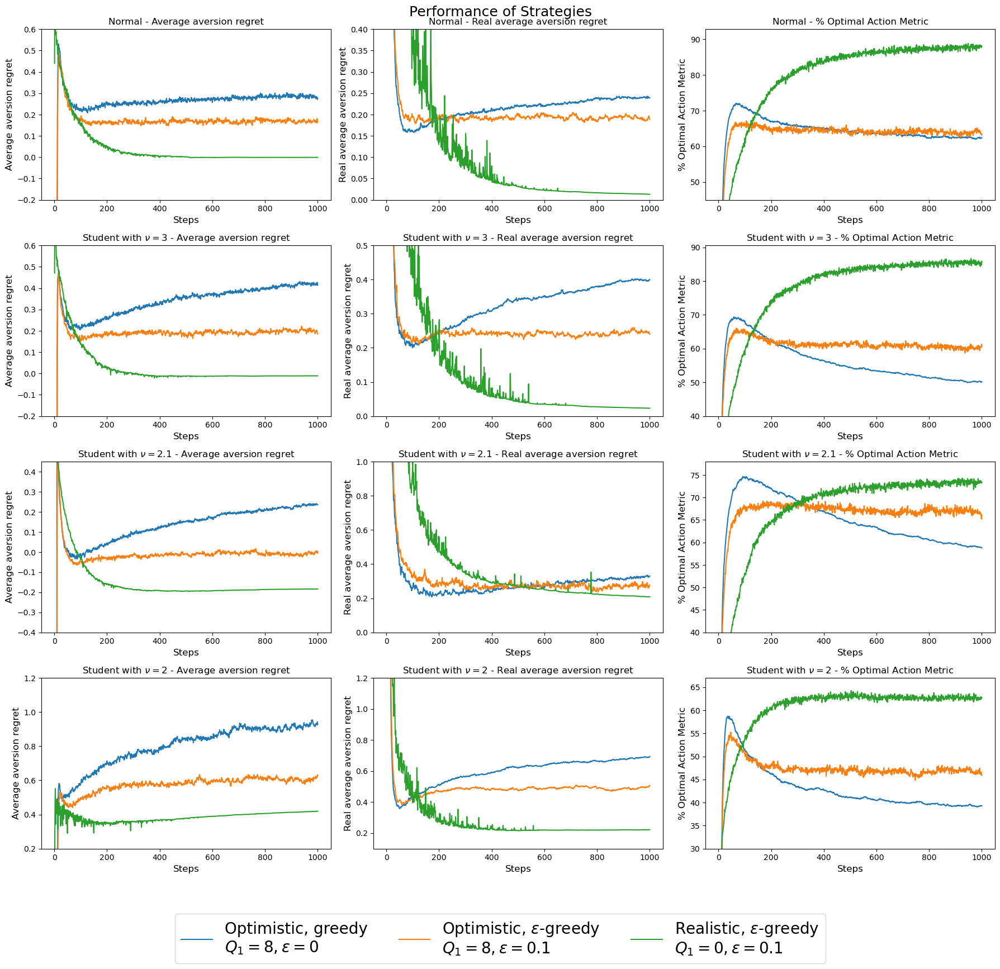

In [225]:
plot_strategies_results(metrics, labels, set_ylim, set_legend_outside=True)

In [233]:
def set_label_ylim(label: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.5, 1.5)
        axes_flat[3 * i + 1].set_ylim(0.1, 1)
        axes_flat[3 * i + 2].set_ylim(30, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(-0.1, 0.7)
        axes_flat[3 * i + 1].set_ylim(0.05, 0.7)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.3, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.6)
        axes_flat[3 * i + 2].set_ylim(40, None)

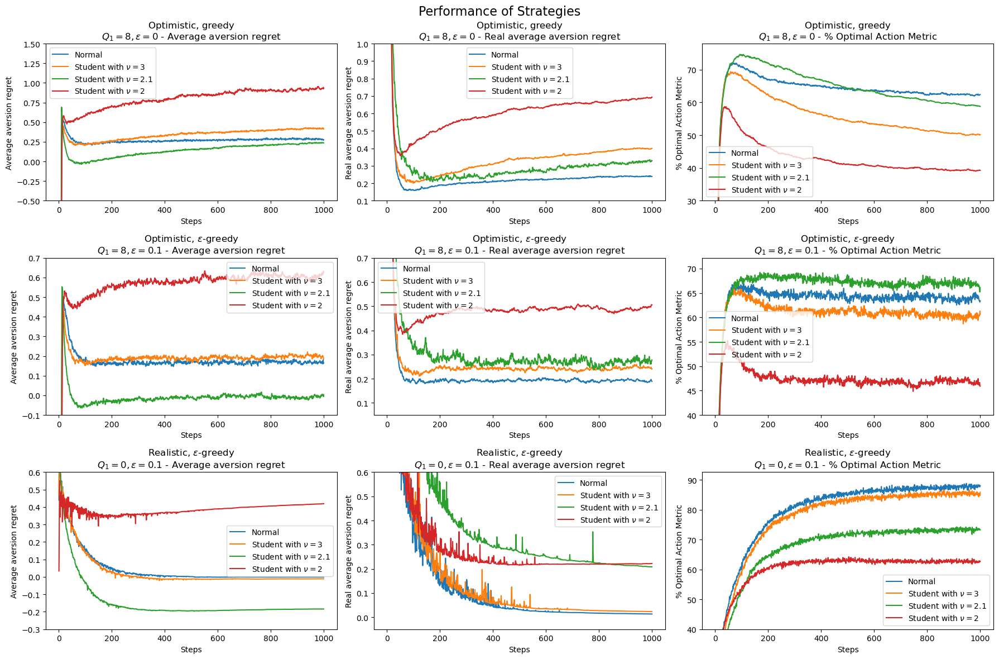

In [234]:
plot_distributions_results(metrics, labels, set_label_ylim)

## Upper-Confidence-Bound Action Selection

In [235]:
class UCB(AversionStrategy):
    def __init__(self, num_arms, c=2, step_size=lambda count: 1 / count, aversion=1., experimental=False):
        super().__init__(num_arms, step_size=step_size, aversion=aversion)
        self.c = c  # Exploration parameter
        self.t = 0 # time
        self.experimental = experimental # Experimental feature for testing confidence bound for variance

    def choose_arm(self) -> tuple[int, np.ndarray]:
        self.t += 1  # Track total number of steps taken
        # Avoid division by zero by adding a small constant to the denominator
        return np.random.choice(np.arange(self.num_arms), p=self.probs), self.probs
    
    def update(self, arm, reward):
        self._update_counts_q_and_s_values(arm, reward)

        safe_counts = np.maximum(self.counts, 0.001)  # Ensure no element is zero
        q_values_upper_bounds = self.q_values + self.c * np.sqrt(np.log(self.t) / safe_counts)
        self.probs = get_optimal_probs(q_values_upper_bounds, self.s_values, self.aversion)
        self.probs /= np.sum(self.probs)
        

In [236]:
strategies = [UCB, EpsilonGreedy]
strategies_params = [{'c': 2}, {'epsilon': 0.1}]

In [237]:
metrics = compare_strategies(distributions, distributions_params, distributions_names, strategies, strategies_params)

Normal
Student with $\nu=3$
Student with $\nu=2.1$
Student with $\nu=2$


In [250]:
labels = [r"UCB $c=2$", r"$\epsilon$-greedy, $\epsilon = 0.1$"]

def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.2, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 1)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(-0.2, 0.6)
        axes_flat[3 * i + 1].set_ylim(-0.05, 1)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.4, 0.45)
        axes_flat[3 * i + 1].set_ylim(0.1, 1.25)
        axes_flat[3 * i + 2].set_ylim(50, None)
    elif i == 3:
        axes_flat[3 * i].set_ylim(0.2, 0.8)
        axes_flat[3 * i + 1].set_ylim(0.1, 1)
        axes_flat[3 * i + 2].set_ylim(40, None)

In [241]:
save_new_metrics(metrics, 'UCB_test')

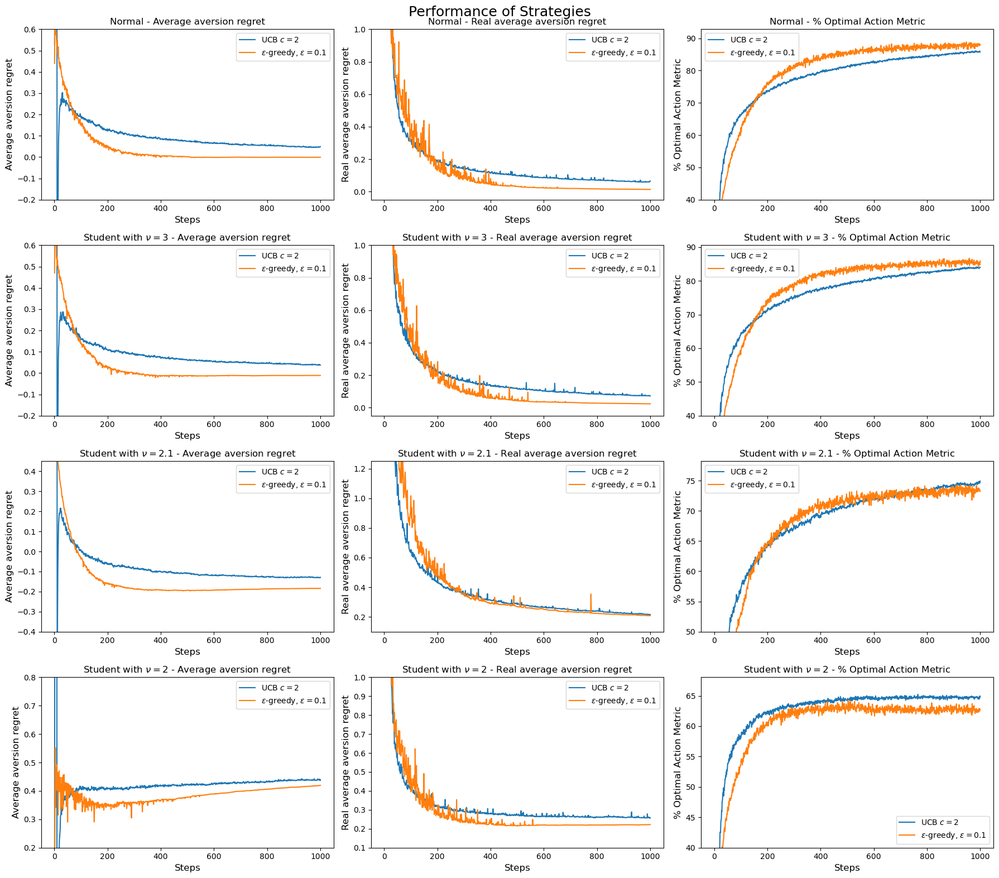

In [251]:
plot_strategies_results(metrics, labels, set_ylim)

In [258]:
def set_label_ylim(label: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.5, 1)
        axes_flat[3 * i + 1].set_ylim(-0.1, 1)
        axes_flat[3 * i + 2].set_ylim(40, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(None, 0.7)
        axes_flat[3 * i + 1].set_ylim(-0.05, 1.5)
        axes_flat[3 * i + 2].set_ylim(30, None)

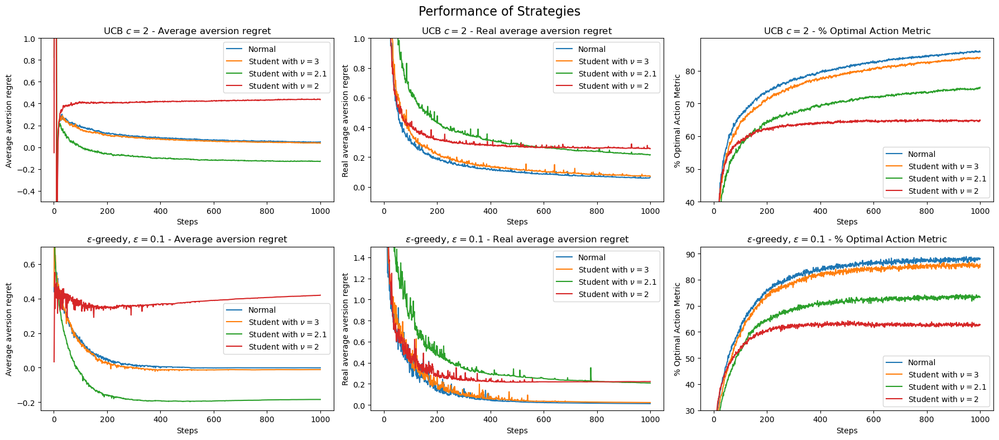

In [259]:
plot_distributions_results(metrics, labels, set_label_ylim)

In [260]:
aversion_metrics = compare_aversions(distributions, distributions_params, distributions_names, UCB, {'c': 2}, aversions)

Normal
Student with $\nu=3$
Student with $\nu=2.1$
Student with $\nu=2$


In [261]:
save_new_metrics(aversion_metrics, 'ucb_aversions_test')

In [269]:
def set_ylim(key: str, i: int, axes_flat) -> None:
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.8, 1)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.6)
        axes_flat[3 * i + 2].set_ylim(35, None)
    elif i == 1:
        axes_flat[3 * i].set_ylim(-0.8, 1)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.75)
        axes_flat[3 * i + 2].set_ylim(35, None)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.8, 1)
        axes_flat[3 * i + 1].set_ylim(-0.05, 2)
        axes_flat[3 * i + 2].set_ylim(35, None)
    elif i == 3:
        axes_flat[3 * i].set_ylim(-0.8, 1)
        axes_flat[3 * i + 1].set_ylim(-0.05, 0.75)

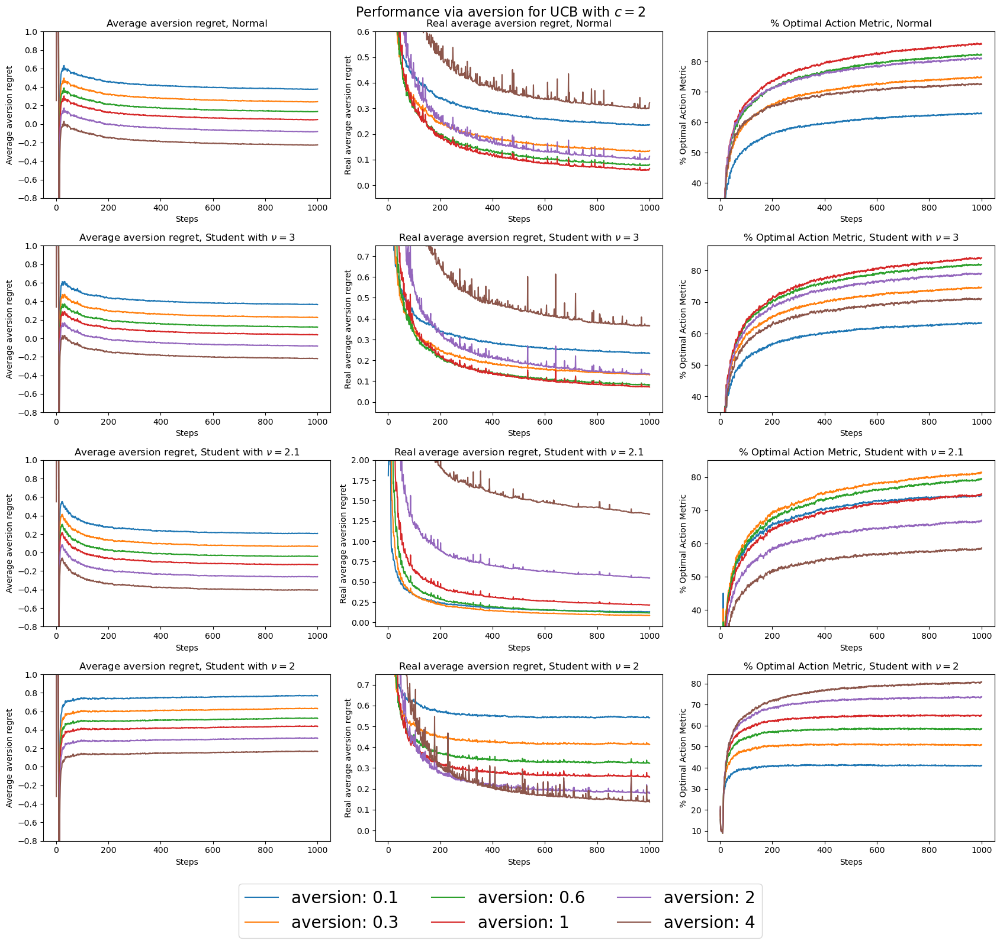

In [270]:
plot_aversion_depend_on_distribution_results(aversion_metrics, aversions, r"UCB with $c=2$", set_ylim)

In [276]:
def set_label_ylim(label: str, i: int, axes_flat) -> None:
    axes_flat[3 * i].set_ylim(-1, 1)
    axes_flat[3 * i + 2].set_ylim(30, None)
    if i == 0:
        axes_flat[3 * i].set_ylim(-0.25, 1)
        axes_flat[3 * i + 1].set_ylim(None, 1)
    elif i == 1:
        axes_flat[3 * i].set_ylim(-0.5, 1)
        axes_flat[3 * i + 1].set_ylim(0, 0.8)
    elif i == 2:
        axes_flat[3 * i].set_ylim(-0.5, 1)
        axes_flat[3 * i + 1].set_ylim(-0.1, 0.8)
    elif i == 3:
        axes_flat[3 * i].set_ylim(-0.5, 0.75)
        axes_flat[3 * i + 1].set_ylim(-0.1, 2)
    elif i == 4:
        axes_flat[3 * i].set_ylim(-0.75, 0.75)
        axes_flat[3 * i + 1].set_ylim(-0.1, 2.5)
    elif i == 5:
        axes_flat[3 * i].set_ylim(-0.75, 0.5)
        axes_flat[3 * i + 1].set_ylim(-0.1, 4)
        

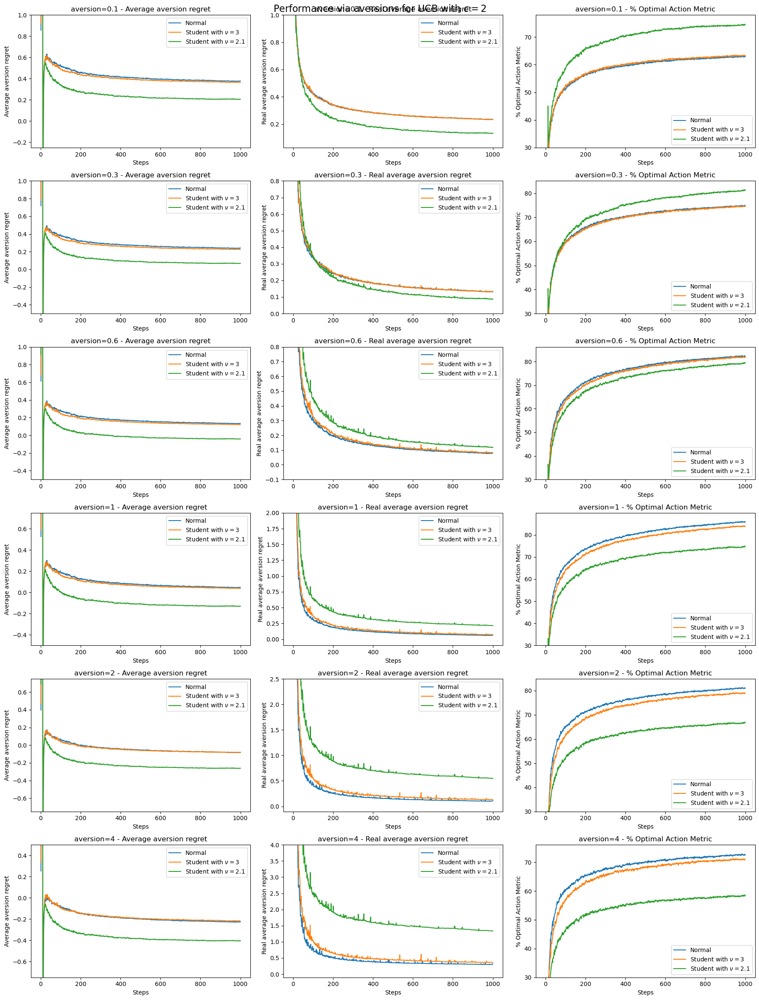

In [277]:
plot_results_via_aversions(aversion_metrics, aversions, r"UCB with $c=2$", set_label_ylim)

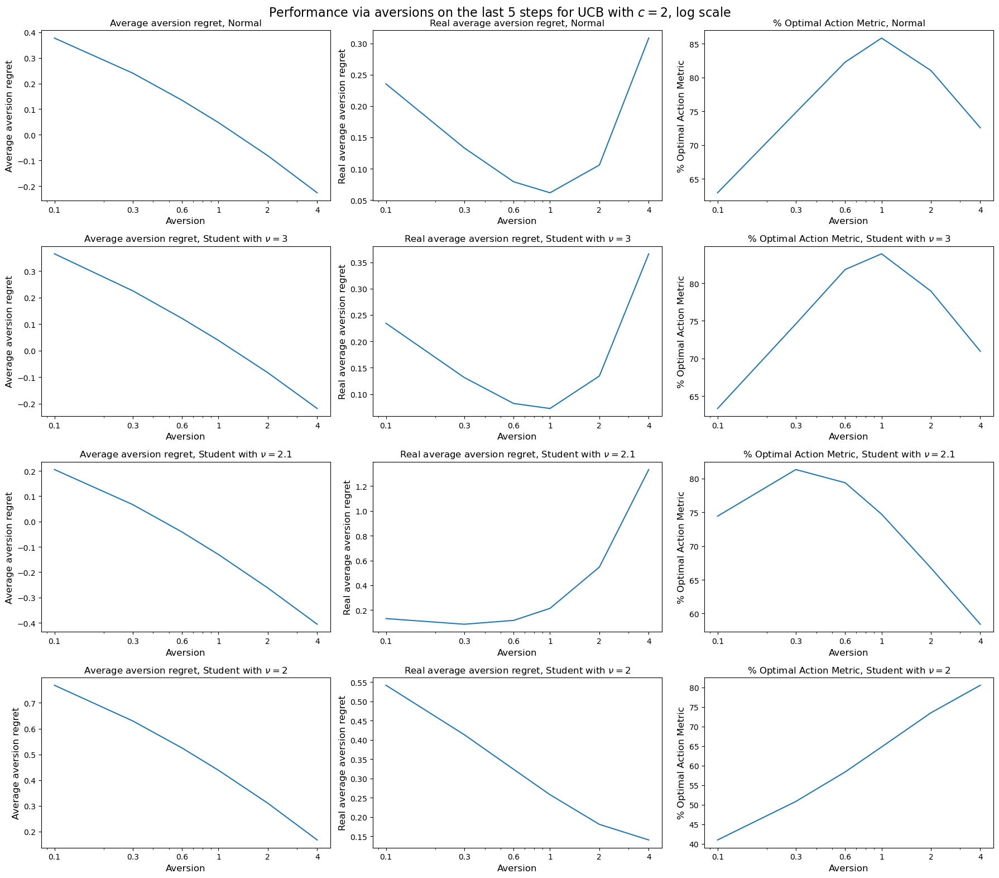

In [264]:
plot_last_results_depending_on_aversion(aversion_metrics, aversions, r"UCB with $c=2$")

## Gradient bandits

In [13]:
class GradientBandit(AversionStrategy):
    def __init__(self, num_arms, baseline=True, alpha=0.1, step_size=lambda x: 1 / x, aversion=1.):
        super().__init__(num_arms, step_size=step_size, aversion=aversion)
        self.h_values = np.zeros(self.num_arms)
        self.probs = np.zeros(self.num_arms)
        self.alpha = alpha
        self.has_baseline = baseline
        self.t = 0
        self.avg_q_values = 0
        self.avg_q_square_values = 0

    def choose_arm(self) -> tuple[int, np.ndarray]:
        self.probs = np.exp(self.h_values) / np.sum(np.exp(self.h_values))
        return np.random.choice(self.num_arms, p=self.probs), self.probs

    def update(self, arm, reward):
    
        baseline = 0 if not self.has_baseline else self.avg_q_values -\
            2 * self.aversion * self.probs[arm] * (
                self.counts[arm] * self.q_square_values[arm] - 2 * self.q_values[arm] * self.avg_q_values +
                                   self.avg_q_square_values) / (self.counts[arm] + 1)

        self.t += 1
        new_q_value = self.q_values[arm] + self.step_size(self.counts[arm] + 1) * (reward - self.q_values[arm])
        new_q_square_value = self.q_square_values[arm] +\
            self.step_size(self.counts[arm] + 1) * (reward ** 2 - self.q_square_values[arm])
        new_s_value = 0 if self.counts[arm] == 0 else ((self.counts[arm] + 1) / self.counts[arm]) *\
            (new_q_square_value - new_q_value ** 2)
        aversion_reward = reward - 2 * self.aversion * self.probs[arm] * new_s_value

        delta_reward = aversion_reward - baseline
        self.h_values -= self.alpha * delta_reward * self.probs
        self.h_values[arm] += self.alpha * delta_reward
        self.h_values -= np.max(self.h_values)

        self._update_counts_q_and_s_values(arm, reward)

        self.avg_q_values += (self.step_size(self.t) * (reward - self.avg_q_values)) if self.has_baseline else 0
        self.avg_q_square_values += (self.step_size(self.t) * (reward ** 2 - self.avg_q_values)) if self.has_baseline else 0

In [ ]:
class GradientBandit2(AversionStrategy):
    def __init__(self, num_arms, baseline=True, alpha=0.1, step_size=lambda x: 1 / x, aversion=1.):
        super().__init__(num_arms, step_size=step_size, aversion=aversion)
        self.h_values = np.zeros(self.num_arms)
        self.probs = np.zeros(self.num_arms)
        self.alpha = alpha
        self.has_baseline = baseline
        self.t = 0
        self.baseline = 0

    def choose_arm(self) -> tuple[int, np.ndarray]:
        self.probs = np.exp(self.h_values) / np.sum(np.exp(self.h_values))
        return np.random.choice(self.num_arms, p=self.probs), self.probs

    def update(self, arm, reward):

        self.counts[arm] += 1
        self.t += 1

        delta_reward = reward - self.baseline
        self.h_values -= self.alpha * delta_reward * self.probs
        self.h_values[arm] += self.alpha * delta_reward
        self.h_values -= np.max(self.h_values)

        self.baseline += (self.step_size(self.t) * delta_reward) if self.has_baseline else 0

        self._update_counts_q_and_s_values(arm, reward)

        self.avg_q_values += (self.step_size(self.t) * (reward - self.avg_q_values)) if self.has_baseline else 0
        self.avg_q_square_values += (self.step_size(self.t) * (reward ** 2 - self.avg_q_values)) if self.has_baseline else 0

In [14]:
loc_sampler = norm(loc=5, scale=1)
biased_distributions_params = [{'loc_sampler': loc_sampler},
                        {'mu': 3, 'loc_sampler': loc_sampler},
                        {'mu': 2, 'loc_sampler': loc_sampler},
                        {'loc_sampler': loc_sampler}]

In [15]:
strategies = [GradientBandit, GradientBandit, GradientBandit, GradientBandit]
strategies_params = [{'baseline': True, 'alpha': 0.1},
                     {'baseline': True, 'alpha': 0.4},
                     {'baseline': False, 'alpha': 0.1},
                     {'baseline': False, 'alpha': 0.4}]

In [16]:
average_rewards, optimal_actions = compare_strategies(distributions, biased_distributions_params, distributions_names, strategies, strategies_params)

Normal
Student with $\nu=3$
Student with $\nu=2$
Cauchy


In [17]:
save_new_metrics(average_rewards, optimal_actions, "gradient_bandits_test")

In [18]:
labels = [r"$\alpha=0.1$, with baseline",
          r"$\alpha=0.4$, with baseline",
          r"$\alpha=0.1$, without baseline",
          r"$\alpha=0.4$, without baseline"]

def set_ylim(key: str, i: int, axes_flat) -> None:
    # Special adjustments for the last row (Standard Cauchy)
    if key == "Standard Cauchy":
        axes_flat[2 * i].set_ylim(-25, 25)  # Set x-axis limits for average reward

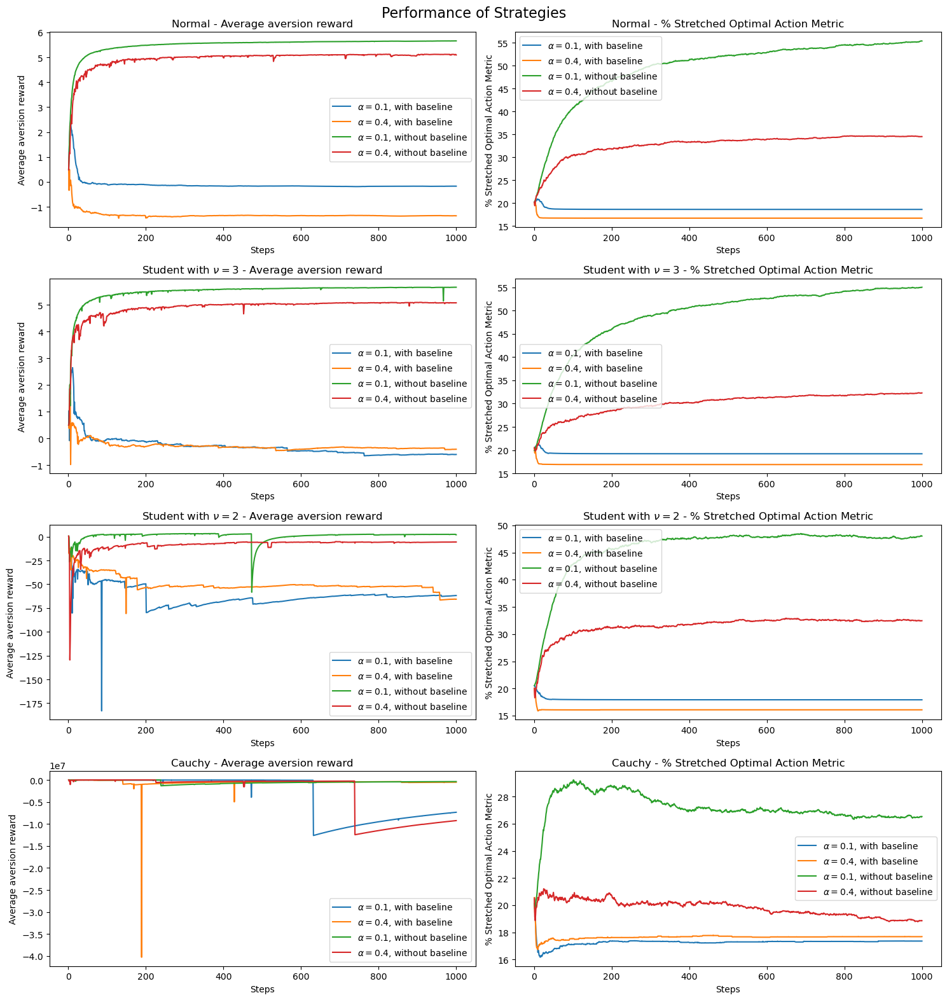

In [19]:
plot_strategies_results(average_rewards, optimal_actions, labels, set_ylim)

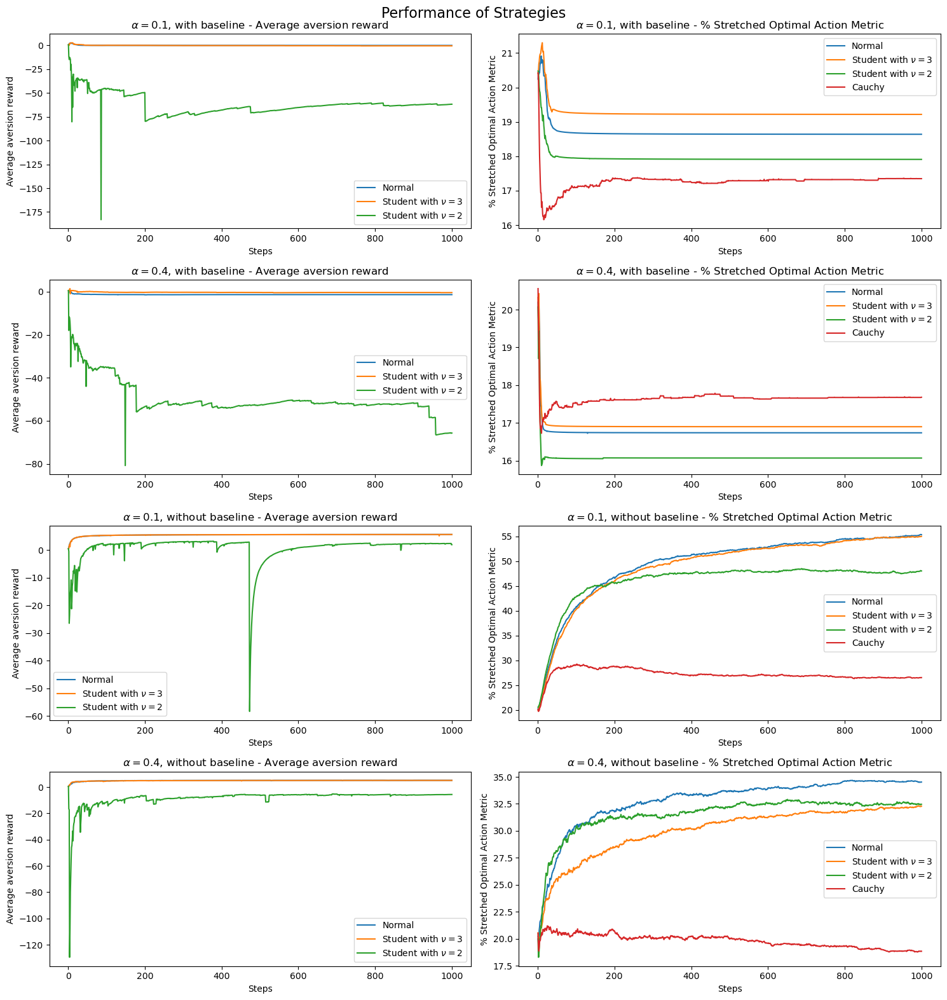

In [20]:
plot_same_strategies_for_optimal_actions(average_rewards, optimal_actions, labels)